##GOLDBACH CONJECTURE VISUALIZATION

####mounting drive

In [1]:
#integrating google drive to colab
from google.colab import drive
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).




---



####BELOW CELLS ARE JUST FOR REFERNCE , DONT TAMPER WITH THEM



---



####Lets write a python code to extract all possible pairs , for every given even number and save that csv to drive
you can change `end_even` variable in below code to cusomize till how much you want data in your csv

In [ ]:
import os
import csv

def is_prime(num):
    if num < 2:
        return False
    for i in range(2, int(num**0.5) + 1):
        if num % i == 0:
            return False
    return True

def find_primes_summing_to_even(even_num):
    primes = [i for i in range(2, even_num) if is_prime(i)]
    prime_pairs = [(p, q) for p in primes for q in primes if p <= q and p + q == even_num]
    return prime_pairs

def generate_goldbach_csv(filename, start, end):
    # Create folders if they don't exist
    folder_path = os.path.dirname(filename)
    os.makedirs(folder_path, exist_ok=True)

    with open(filename, 'w', newline='') as csvfile:
        fieldnames = ['Even Number', 'Prime P', 'Prime Q']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

        for even_num in range(start, end+1, 2):
            prime_pairs = find_primes_summing_to_even(even_num)
            for p, q in prime_pairs:
                writer.writerow({'Even Number': even_num, 'Prime P': p, 'Prime Q': q})

if __name__ == "__main__":
    csv_filename = '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv'
    start_even = 2
    end_even = 100 #change this according to preferance

    generate_goldbach_csv(csv_filename, start_even, end_even)
    print(f"CSV file '{csv_filename}' generated successfully.")


CSV file 'google_colab/goldbach_conjecture/goldbach_conjecture100.csv' generated successfully.


In [ ]:
#viewing the above generated file
import pandas as pd

# Specify the file path
csv_filename = '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_filename)

# Display the first 10 rows
df.head(10)


,Even Number,Prime P,Prime Q
0,4,2,2
1,6,3,3
2,8,3,5
3,10,3,7
4,10,5,5
5,12,5,7
6,14,3,11
7,14,7,7
8,16,3,13
9,16,5,11


####visualizing using graph

Now lets create a graph, which is having even numbers on x axis and their possible p and q on y axis and this time we will plot all possible (p,q) tuples , but each tuple will have unique color

In [ ]:
#installing matplotlib
!pip install matplotlib

<ipython-input-46-42151f796876>:30: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=10)
<ipython-input-46-42151f796876>:31: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [q], c=color, marker='o', s=10)


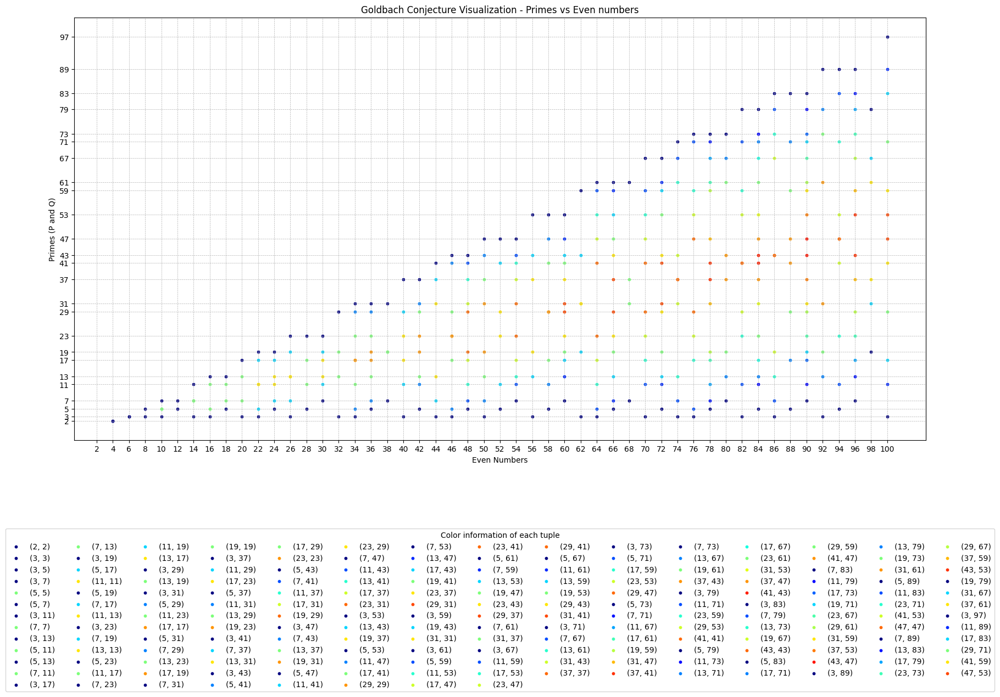

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sympy import primerange

def generate_unique_colors(num_colors):
    return [plt.cm.jet(i / num_colors) for i in range(num_colors)]

def plot_goldbach_conjecture(csv_filename, start_even, end_even):
    # Load the CSV file into a DataFrame
    df = pd.read_csv(csv_filename)

    # Group by the 'Even Number' column and collect unique 'Prime P' and 'Prime Q' pairs
    grouped = df.groupby('Even Number').apply(lambda x: x[['Prime P', 'Prime Q']].values.tolist()).reset_index(name='Pairs')

    # Plotting
    fig, ax = plt.subplots(figsize=(20, 10))

    all_numbers = set()

    for index, row in grouped.iterrows():
        even_num = row['Even Number']
        pairs = row['Pairs']

        unique_colors = generate_unique_colors(len(pairs))

        for i, (p, q) in enumerate(pairs):
            color = unique_colors[i]

            ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=10)
            ax.scatter([even_num], [q], c=color, marker='o', s=10)

        all_numbers.add(even_num)
        for p, q in pairs:
            all_numbers.add(p)
            all_numbers.add(q)

    all_numbers = sorted(list(all_numbers))

    # Set x-axis ticks and labels explicitly
    x_ticks = np.arange(min(all_numbers), max(all_numbers) + 1, step=2)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks)

    # Set y-axis ticks with prime numbers
    y_ticks = list(primerange(min(all_numbers), max(all_numbers) + 1))
    ax.set_yticks(y_ticks)

    # Set labels and legend
    ax.set_xlabel('Even Numbers')
    ax.set_ylabel('Primes (P and Q)')
    ax.legend(title='Color information of each tuple', bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=15)


    # Add grid lines
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Show the plot
    plt.title('Goldbach Conjecture Visualization - Primes vs Even numbers')
    plt.show()

def save_plot_image(save_plot=True, filename='/content/drive/MyDrive/google_colab/goldbach_conjecture/graphs/goldbach_conjecture_plot.png'):
    # Create a folder named 'graphs' if it doesn't exist
    folder_path = 'graphs'
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

    # Save the plot image in the 'graphs' folder with the specified filename
    file_path = os.path.join(folder_path, filename)
    plt.savefig(file_path, bbox_inches='tight', dpi=300)  # Adjust dpi for high-quality images

    print(f"Plot image saved at: {file_path}")

# Specify the file path
csv_filename = '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv'

# Specify the range of even numbers to display on the x-axis
start_even = 2
end_even = 100

# Plot Goldbach Conjecture
plot_goldbach_conjecture(csv_filename, start_even, end_even)

# Set the variable to decide whether to save the plot
save_plot_to_drive = False  # Change to False if you don't want to save

# Save the plot image if the variable is True
if save_plot_to_drive:
    save_plot_image()


####Creating a Graph connecting dots(conical shape) for visualization
extreme dot to extreme , top most to top most and bottom most to bottom

<ipython-input-3-de98bc8be66f>:112: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=5)
<ipython-input-3-de98bc8be66f>:113: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [q], c=color, marker='o', s=5)


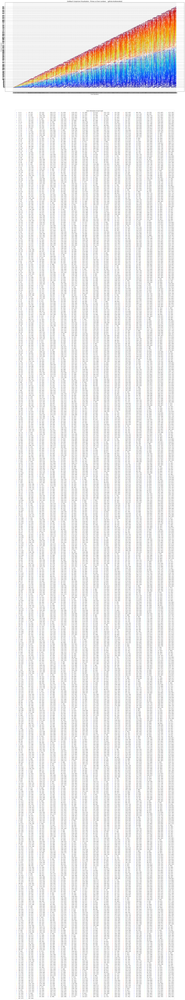

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sympy import primerange
import os

def generate_unique_colors(num_colors):
    return [plt.cm.jet(i / num_colors) for i in range(num_colors)]

def plot_line(plot_points, vertical_plot_points, is_last):
  numberofpoints_new = len(vertical_plot_points)
  numberoflines_old = len(plot_points)
  if numberofpoints_new > numberoflines_old:
     diff = numberofpoints_new - numberoflines_old
     f_ = int((numberoflines_old) / 2)
     for i in range(f_):
      plot_points[i].append(vertical_plot_points[i])
     #here now create a list in that old and append this new to it
     for i in range(diff):
      plot_points = plot_points[:i+f_] + [[vertical_plot_points[i+f_]]] + plot_points[i+f_:]
     for i in range(f_):
      plot_points[i+diff+f_].append(vertical_plot_points[i+diff+f_])
     plot_points = plot_points
     #don't draw the graph just append the points
     #logic for joining lines
  if numberofpoints_new == numberoflines_old:
    result = []
    for sublist, new_element in zip(plot_points, vertical_plot_points):
        new_sublist = sublist + [new_element]
        result.append(new_sublist)
    plot_points = result


  if numberofpoints_new < numberoflines_old:
    #draw the graph first
    # Plotting each line

    for i, line in enumerate(plot_points):
        unique_colors_ = generate_unique_colors(len(plot_points))
        x, y = zip(*line)  # Unzip the list of tuples
        plt.plot(x, y, color=unique_colors_[i])
    #logic
    #now update the list and join the discontinus graph
    last_elements__ = [sublist[-1] for sublist in plot_points if sublist]

    #here we have to re initiate the old list to new list
    # Create a new list of lists
    plot_points = [[point] for point in vertical_plot_points]
    # front_list = [point[0] for sublist in plot_points for point in sublist]
    front_list = [item for sublist in plot_points for item in sublist]
    less_len  = len(plot_points)
    less_len_ = int(less_len /2)

    last_elements_ = [(t[0], t[1]) for t in last_elements__]
    last_elements = last_elements_[:less_len_] + last_elements_[-less_len_:]
    #now join plot points and last elements
    # Unpack the points from each list
    # print("last ele")
    # print(last_elements)
    x1, y1 = zip(*last_elements)
    # print("front list")
    # print(front_list)
    x2, y2 = zip(*front_list)
    # print("--- this zip dick")
    # print(x1, y1 )
    # print("2 is below")
    # print(x2, y2 )
    # Plot lines without dots
    unique_colors__ = generate_unique_colors(len(last_elements))
    for i in range(len(last_elements)):
        plt.plot([x1[i], x2[i]], [y1[i], y2[i]], color=unique_colors__[i],linewidth=1)


  if is_last:
    #draw the plot
    unique_colors_ = generate_unique_colors(len(plot_points))
    for i, line in enumerate(plot_points):
        unique_colors_ = generate_unique_colors(len(plot_points))
        x, y = zip(*line)  # Unzip the list of tuples
        plt.plot(x, y, color=unique_colors_[i],linewidth=1)
    plot_points = None
  return plot_points


def plot_goldbach_conjecture(csv_filename, start_even, end_even):
    # Load the CSV file into a DataFrame
    df = pd.read_csv(csv_filename)

    # Filter DataFrame based on start_even and end_even
    df = df[df['Even Number'] <= end_even]
    # Group by the 'Even Number' column and collect unique 'Prime P' and 'Prime Q' pairs
    grouped = df.groupby('Even Number').apply(lambda x: x[['Prime P', 'Prime Q']].values.tolist()).reset_index(name='Pairs')

    # Plotting
    fig, ax = plt.subplots(figsize=(30, 15))

    all_numbers = set()
    # Get the total number of iterations
    total_iterations = len(grouped)
    #here we will be having old list
    plot_points = []
    for index, row in grouped.iterrows():
        even_num = row['Even Number']
        pairs = row['Pairs']
        unique_colors = generate_unique_colors(len(pairs))

        all_numbers.add(even_num)
        vertical_plot_points = []
        for i, (p, q) in enumerate(pairs):
            color = unique_colors[i]

            ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=5)
            ax.scatter([even_num], [q], c=color, marker='o', s=5)
            #adding to all numbers
            all_numbers.add(p)
            all_numbers.add(q)
            #append this tuples to new list
            vertical_plot_points.append((even_num,p))
            vertical_plot_points.append((even_num,q))


        # Check if it's the last iteration
        is_last = (index == total_iterations - 1)
        #here we will be having list of all points which are plotted say new list and also old list
        # print("This is input to add")
        vertical_plot_points=sorted(vertical_plot_points, key=lambda x: x[1])
        # print(vertical_plot_points)
        plot_points = plot_line(plot_points, vertical_plot_points, is_last)
        #here we will call a function which takes new and old list (list of list)
        #and output old list which is list of list.


    all_numbers = sorted(list(all_numbers))

    # Set x-axis ticks and labels explicitly
    x_ticks = np.arange(min(all_numbers), max(all_numbers) + 1, step=2)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks)

    # Set y-axis ticks with prime numbers
    y_ticks = list(primerange(min(all_numbers), max(all_numbers) + 1))
    ax.set_yticks(y_ticks)

    # Set labels and legend
    ax.set_xlabel('Even Numbers')
    ax.set_ylabel('Primes (P and Q)')
    ax.legend(title='Color information of each tuple', bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=15)


    # Add grid lines
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Show the plot
    plt.title('Goldbach Conjecture Visualization - Primes vs Even numbers    (github:shubhamatkal)')
    plt.show()

# def save_plot_image(save_plot=True, filename='/content/drive/MyDrive/google_colab/goldbach_conjecture/graphs/goldbach_conjecture_plot.png'):
#     # Create a folder named 'graphs' if it doesn't exist
#     folder_path = 'graphs'
#     if not os.path.exists(folder_path):
#         os.makedirs(folder_path)

#     # Save the plot image in the 'graphs' folder with the specified filename
#     file_path = os.path.join(folder_path, filename)
#     plt.savefig(file_path, bbox_inches='tight', dpi=300)  # Adjust dpi for high-quality images

#     print(f"Plot image saved at: {file_path}")

# Specify the file path
csv_filename = 'goldbach_conjecture100.csv'

# Specify the range of even numbers to display on the x-axis
start_even = 2
end_even = 1000

# Plot Goldbach Conjecture
plot_goldbach_conjecture(csv_filename, start_even, end_even)

# Set the variable to decide whether to save the plot
save_plot_to_drive = False  # Change to False if you don't want to save

# Save the plot image if the variable is True
# if save_plot_to_drive:
#     save_plot_image()


####frequency of pairs scatterplot

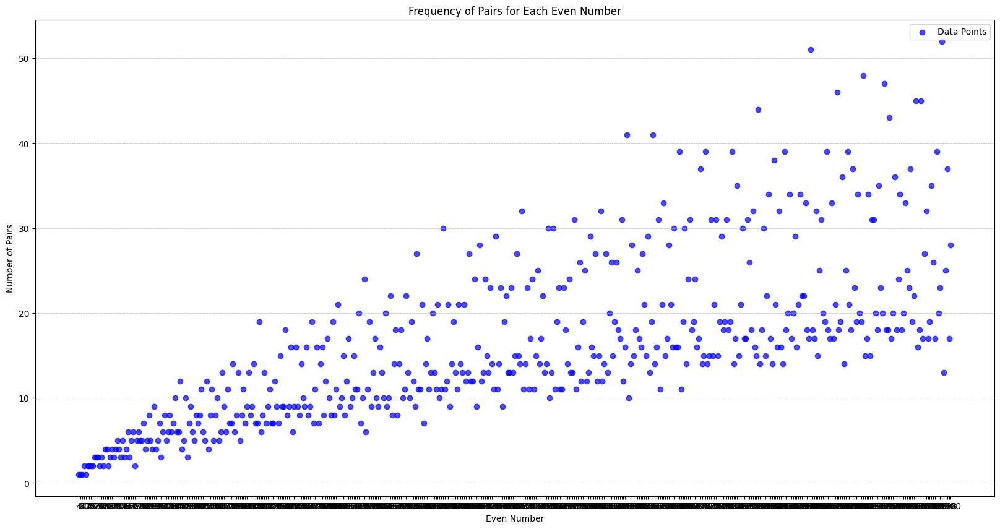

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file assuming the first column contains even numbers
data = pd.read_csv('/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv')

even_numbers = data["Even Number"]

# Calculate the frequency of each even number
frequencies = even_numbers.value_counts()

# Sort the data by even numbers for visualization
data = pd.DataFrame({'even numbers': frequencies.index, 'frequency': frequencies.values})
data = data.sort_values(by='even numbers')

# Extract the sorted x and y values
even_numbers = data["even numbers"]
frequencies = data["frequency"]

# Create the scatter plot with markers
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
plt.scatter(even_numbers, frequencies, marker='o', color='b', alpha=0.7, label='Data Points')

# Set labels and title
plt.xlabel('Even Number')
plt.ylabel('Number of Pairs')
plt.title('Frequency of Pairs for Each Even Number')
plt.legend()
plt.grid(axis='y', linestyle='--', linewidth=0.5)

# Show all even numbers on x-axis as text
plt.xticks(even_numbers)

# Show the plot
plt.show()




---



DONT CHANGE ABOVE CODE , DO YOUR THINGS BELOW THIS



---



####creating csv for 1000 even numbers

In [51]:
import os
import csv

def is_prime(num):
    if num < 2:
        return False
    for i in range(2, int(num**0.5) + 1):
        if num % i == 0:
            return False
    return True

def find_primes_summing_to_even(even_num):
    primes = [i for i in range(2, even_num) if is_prime(i)]
    prime_pairs = [(p, q) for p in primes for q in primes if p <= q and p + q == even_num]
    return prime_pairs

def generate_goldbach_csv(filename, start, end):
    # Create folders if they don't exist
    folder_path = os.path.dirname(filename)
    os.makedirs(folder_path, exist_ok=True)

    with open(filename, 'w', newline='') as csvfile:
        fieldnames = ['Even Number', 'Prime P', 'Prime Q']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

        for even_num in range(start, end+1, 2):
            prime_pairs = find_primes_summing_to_even(even_num)
            for p, q in prime_pairs:
                writer.writerow({'Even Number': even_num, 'Prime P': p, 'Prime Q': q})

if __name__ == "__main__":
    csv_filename = '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv'
    start_even = 2
    end_even = 1000 #change this according to preferance

    generate_goldbach_csv(csv_filename, start_even, end_even)
    print(f"CSV file '{csv_filename}' generated successfully.")


CSV file '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv' generated successfully.


<ipython-input-50-c0de2e5aede2>:30: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=5)
<ipython-input-50-c0de2e5aede2>:31: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([even_num], [q], c=color, marker='o', s=5)


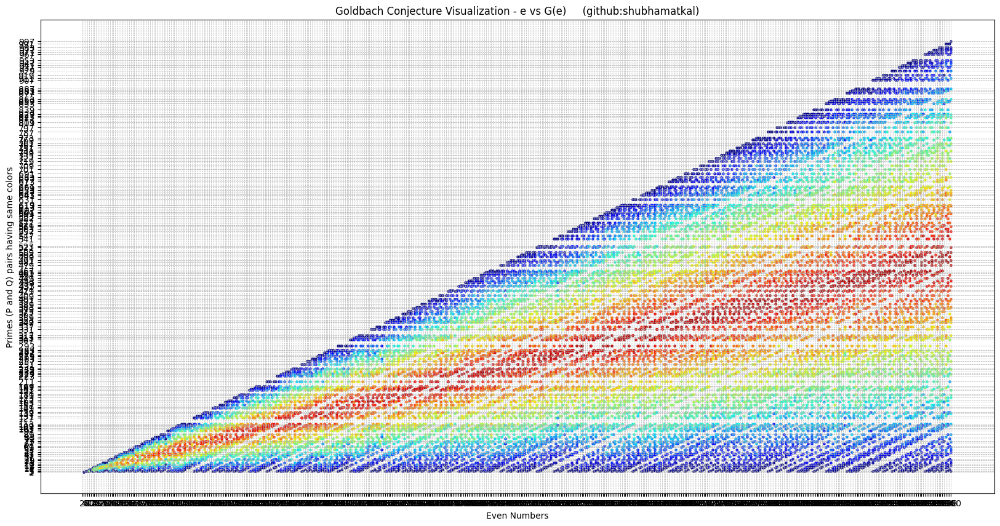

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sympy import primerange

def generate_unique_colors(num_colors):
    return [plt.cm.jet(i / num_colors) for i in range(num_colors)]

def plot_goldbach_conjecture(csv_filename, start_even, end_even):
    # Load the CSV file into a DataFrame
    df = pd.read_csv(csv_filename)

    # Group by the 'Even Number' column and collect unique 'Prime P' and 'Prime Q' pairs
    grouped = df.groupby('Even Number').apply(lambda x: x[['Prime P', 'Prime Q']].values.tolist()).reset_index(name='Pairs')

    # Plotting
    fig, ax = plt.subplots(figsize=(20, 10))

    all_numbers = set()

    for index, row in grouped.iterrows():
        even_num = row['Even Number']
        pairs = row['Pairs']

        unique_colors = generate_unique_colors(len(pairs))

        for i, (p, q) in enumerate(pairs):
            color = unique_colors[i]

            ax.scatter([even_num], [p], c=color, label=f'({p}, {q})', marker='o', s=5)
            ax.scatter([even_num], [q], c=color, marker='o', s=5)

        all_numbers.add(even_num)
        for p, q in pairs:
            all_numbers.add(p)
            all_numbers.add(q)

    all_numbers = sorted(list(all_numbers))

    # Set x-axis ticks and labels explicitly
    x_ticks = np.arange(min(all_numbers), max(all_numbers) + 1, step=2)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks)

    # Set y-axis ticks with prime numbers
    y_ticks = list(primerange(min(all_numbers), max(all_numbers) + 1))
    ax.set_yticks(y_ticks)

    # Set labels and legend
    ax.set_xlabel('Even Numbers')
    ax.set_ylabel('Primes (P and Q) pairs having same colors')
    # ax.legend(title='Color information of each tuple', bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=15)


    # Add grid lines
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Show the plot
    plt.title('Goldbach Conjecture Visualization - e vs G(e)     (github:shubhamatkal)')
    plt.show()

def save_plot_image(save_plot=True, filename='/content/drive/MyDrive/google_colab/goldbach_conjecture/graphs/goldbach_conjecture_plot.png'):
    # Create a folder named 'graphs' if it doesn't exist
    folder_path = 'graphs'
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

    # Save the plot image in the 'graphs' folder with the specified filename
    file_path = os.path.join(folder_path, filename)
    plt.savefig(file_path, bbox_inches='tight', dpi=500)  # Adjust dpi for high-quality images

    print(f"Plot image saved at: {file_path}")

# Specify the file path
csv_filename = '/content/drive/MyDrive/google_colab/goldbach_conjecture/goldbach_conjecture100.csv'

# Specify the range of even numbers to display on the x-axis
start_even = 2
end_even = 1000

# Plot Goldbach Conjecture
plot_goldbach_conjecture(csv_filename, start_even, end_even)

# Set the variable to decide whether to save the plot
save_plot_to_drive = False  # Change to False if you don't want to save

# Save the plot image if the variable is True
if save_plot_to_drive:
    save_plot_image()
